In [36]:
from pathlib import Path
import matplotlib.pyplot as plt
from nucleo.io.plots_2D import plot_all_heatmaps

root = Path("/home/nicolas/Documents/Workspace/nucleo/outputs/NUCLEO__PSMN__2026-06-19/")

fig1, axes1 = plot_all_heatmaps(
    speed_cols=["vf", "wf"],
    root=root,
    type_of_data="norm_th",
    plot_log2=True,
)
fig1.savefig("/tmp/fig1.png", dpi=150, bbox_inches="tight")

Plotting heatmaps: 100%|██████████| 20/20 [00:01<00:00, 14.92it/s]


Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...
Scanning 222200 parquet files...


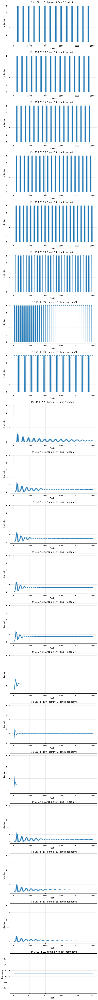

In [37]:
from nucleo.io.reading import finding_one_parquet
import polars as pl
import numpy as np
import matplotlib.pyplot as plt

root = "/home/nicolas/Documents/Workspace/nucleo/outputs/NUCLEO__PSMN__2026-06-19"

params_fixed = {
    "algo": "1S", 
    "fact": False, 
    "mode": "none", 
    "dstr": False,
    "s": 150,
    "mu": 150, 
    "theta": 100, 
    "alphar": 0.00, 
    "Kp": 0.00, 
    "Kz": 0.00
}

root_config = "/home/nicolas/Documents/Workspace/nucleo/outputs/NUCLEO__PSMN__2026-06-19/scenarios.json"
df_config = pl.read_json(root_config)
# print(df_config)

fig, axes = plt.subplots(ncols=1, nrows=df_config.height, figsize=(8, 4*df_config.height))
for (ax, row) in zip(axes, df_config.iter_rows()):

    land = row[3]
    l = row[1]
    bpmin = row[2]

    params_row = {
        **params_fixed,
        "land": land,
        "l": l,
        "bpmin": bpmin
    }

    df_plot = finding_one_parquet(
        root=root,
        params=params_row
    )

    l_view_to_plot = df_plot["l_view"][0].to_numpy()
    
    title_dict = {
        "s": params_fixed["s"],
        "l": l,
        "bpmin": bpmin,
        "land": land
    }

    title = str(title_dict)
    ax.set_title(title)
    ax.plot(l_view_to_plot)
    ax.set_xlabel("Position")
    ax.set_ylabel("Distribution")
    ax.grid(True, which="both", alpha=0.30)

plt.tight_layout()
fig.savefig("/tmp/fig2.png", dpi=150, bbox_inches="tight")

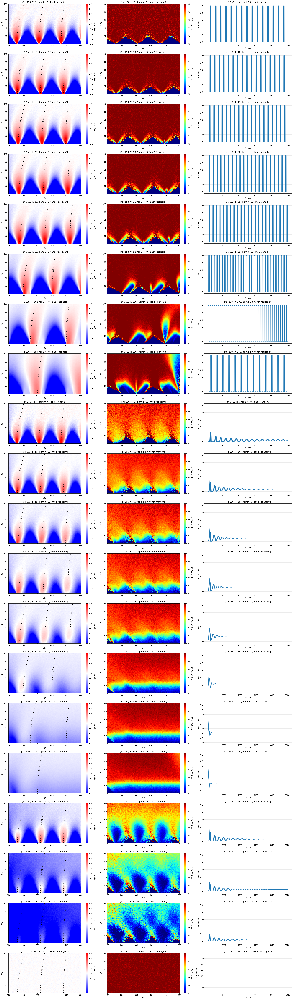

In [38]:
from PIL import Image

img1 = Image.open("/tmp/fig1.png")
img2 = Image.open("/tmp/fig2.png")

w = img1.width + img2.width
h = max(img1.height, img2.height)
combined = Image.new("RGB", (w, h), "white")
combined.paste(img1, (0, 0))
combined.paste(img2, (img1.width, 0))

combined.save("/tmp/combined.png")
combined

# .